In [12]:
import os, sys
import numpy as np
import pandas as pd
%matplotlib inline
import matplotlib.pyplot as plt
import PIL
import cv2
from glob import glob
from IPython.display import display, Image
from io import BytesIO
from functools import partial

sys.path.append(os.path.abspath("/mnt/w/prj/GraduateWork/scripts/"))

from ImageDiff.compare import ImageDiff
from Any2Gif import any2gif

imd = ImageDiff(grayscale=False)
ssim = imd.ssim
mse = imd.mse
psnr = imd.psnr
load = imd.load_images
split = imd.get_splitted
to_image = imd.get_image
print_stats = imd.print_stats
save_stats = imd.save_stats
eval_all = imd.compare_all

def concat_dir(image_dir_1, image_dir_2, concat_dir='img/concat', sort=True, resize=0):
    any2gif.img2img(iamge_dir_1, image_dir_2, concat_dir=concat_dir, sort=sort, resize=resize)

def concat(imageA, imageB, resize=0):
    if isinstance(imageA, str):
        imageA = imd.get_image(imageA, rgb=True)
    if isinstance(imageA, str):
        imageB = imd.get_image(imageB, rgb=True)
    c = imd.get_concated(imageA, imageB, to_rgb=False)
    if resize:
        c = img_resize(c, resize, opencv=True)
    return c
    
def display_img_array(ima):
    im = PIL.Image.fromarray(ima)
    bio = BytesIO()
    im.save(bio, format='png')
    display(Image(bio.getvalue(), format='png', retina=True))

def show(*images, plot=False, rgb=False):
    if plot:
        for im in images:
            if isinstance(im, str):
                im = to_image(im, rgb=rgb)
            plt.figure()
            plt.imshow(im, cmap="gray")
    else:
        for im in images:
            if isinstance(im, str):
                im = to_image(im, rgb=rgb)
            display_img_array(im)

def save(image, name='image.png', rgb=False):
    if not rgb:
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    imd.save_image(image, filename=name)
          
def a2b(image, checkpoint, config, output='./', gpu=0):
    !python /home/sole/prj/GraduateWork/day2night/UNIT/test.py --input $image --config $config --output_folder $output --checkpoint $checkpoint --device $gpu
    dst = os.path.join(output, 'output.png')
    if os.path.exists(dst):
        return to_image(dst)
    print(f'Not converted: {dst}')
    return None

def b2a(image, checkpoint, config, output='./', gpu=0):
    !python /home/sole/prj/GraduateWork/day2night/UNIT/test.py --input $image --config $config --output_folder $output --checkpoint $checkpoint --a2b 0 --device $gpu
    dst = os.path.join(output, 'output.png')
    if os.path.exists(dst):
        return to_image(dst)
    print(f'Not converted: {dst}')
    return None

def evaluate(image1, image2):
    print('SSIM:', ssim(image1, image2))
    print('MSE:', mse(image1, image2))
    print('PSNR:', psnr(image1, image2))
    
def mean_eval(key):
    s = 0
    c = 0
    for k, v in imd.images.items():
        if key in v and v[key]:
            s += v[key]
            c += 1
    if c == 0:
        print(f'No {key} to compute')
    else:
        print(f'{key}: {s/c}')
mean_ssim = partial(mean_eval, key='SSIM')
mean_mse = partial(mean_eval, key='MSE')
mean_psnr = partial(mean_eval, key='PSNR')

def mean_eval_all():
    mean_ssim()
    mean_mse()
    mean_psnr()

In [13]:
data_dir = '/home/sole/prj/data/nexet/nexet_2017_1'
unit_dir = '/home/sole/prj/GraduateWork/day2night/UNIT'
cycle_dir = '/home/sole/prj/GraduateWork/day2night/CycleGAN'
cycle_data = '/home/sole/prj/data/cyclegan'
cycgan=False

## Load images to evaluate

In [30]:
in_path = '/home/sole/prj/GraduateWork/day2night/UNIT/checkpoints/unit_no_err/out_b2a/input/'
out_path = '/home/sole/prj/GraduateWork/day2night/UNIT/checkpoints/unit_no_err/out_b2a/'
# recon_path = '/home/sole/prj/GraduateWork/day2night/UNIT/checkpoints/vgg/out/recon'
# out_path = f'{cycle_data}/out/recon' # CycleGAN
# recon_cyc = f'{cycle_data}/out/recon' # CycleGAN
if cycgan:
    loader = load(out_path, number=50, batch=1)    
else:
    loader = load(in_path, out_path, number=100, batch=1)

In [21]:
def get_image_from_nexet(name):
    if not name.endswith('.jpg'):
        name += '.jpg'
    if os.path.exists(os.path.join(data_dir, 'testA', name)):
        return os.path.join(data_dir, 'testA', name)
    if os.path.exists(os.path.join(data_dir, 'testB', name)):
        return os.path.join(data_dir, 'testB', name)
    if os.path.exists(os.path.join(data_dir, 'trainA', name)):
        return os.path.join(data_dir, 'trainA', name)
    if os.path.exists(os.path.join(data_dir, 'trainB', name)):
        return os.path.join(data_dir, 'trainB', name)
    print(f'No image {name} found')

def image_resize(im, factor=2.5, opencv=True):
    return any2gif.img_resize(im, factor, opencv=True)
    
def add_input_image(images):
    for name, v in imd.images.items():
        if 'images' in v and len(v['images']) == 1:
            im = get_image_from_nexet(name)
            if not im:
                continue
            im = image_resize(to_image(im))
            images.insert(0, im)
            v['images'].insert(0, im)
    return images

def show_imd():
    for name, v in imd.images.items():
        n = len(v['images'])
        if 'images' in v and n > 0:
            print(n)
            c = v['images'][0]
            if n > 1:
                c  = concat(v['images'][0], v['images'][1])
            show(c)

### Clean loaded

In [29]:
imd.clean(full=True)
images = {}
print_stats()

{}


# Evaluate

In [ ]:
for i, images in enumerate(loader):
    if cycgan:
        images = add_input_image(images)
    show_imd()
    eval_all()

In [6]:
print_stats()

{
    "001b630b-1e07-447a-9706-6c0f7aa3c811.mov-0001": {
        "MSE": 48386.43177398816,
        "PSNR": 1.283567643431899,
        "SSIM": 0.2771797929722007,
        "msg": "The images are different"
    },
    "017008d0-e384-4687-a8ca-fb599f0dffa7.mov-0001": {
        "MSE": 53216.83841762459,
        "PSNR": 0.8703129107653911,
        "SSIM": 0.27122623196129275,
        "msg": "The images are different"
    },
    "02c6979e-c81e-457c-a461-9041b04e03f9.mov-0001": {
        "MSE": 22262.715185761976,
        "PSNR": 4.655022305959429,
        "SSIM": 0.4145006537602858,
        "msg": "The images are different"
    },
    "03a3d4f1-3df5-47a7-9857-6fcb5a864c22.mov-0001": {
        "MSE": 19024.937456979627,
        "PSNR": 5.337571231326994,
        "SSIM": 0.40964350989682946,
        "msg": "The images are different"
    },
    "0519f11b-98a2-429a-ba29-f841aeed60f8.mov-0001": {
        "MSE": 33295.791219971776,
        "PSNR": 2.9069102121931785,
        "SSIM": 0.2842411360345

In [7]:
print('Translated UNIT no err')
mean_ssim()
mean_mse()
mean_psnr()

Translated UNIT no err
SSIM: 0.3036782079924214
MSE: 32845.67070356596
PSNR: 3.3529321392461116


In [18]:
print('Reconstructed UNIT no err')
mean_ssim()
mean_mse()
mean_psnr()

Reconstructed UNIT no err
SSIM: 0.9441791807205138
MSE: 134.0112241017345
PSNR: 27.528788649884195


In [32]:
print('Translated UNIT no err b2a')
mean_ssim()
mean_mse()
mean_psnr()

Translated UNIT no err b2a
SSIM: 0.2934879766940581
MSE: 31266.603031022005
PSNR: 3.8663504840874867


In [138]:
print('Translated UNIT')
mean_ssim()
mean_mse()
mean_psnr()

Translated UNIT
SSIM: 0.29148046263385086
MSE: 34177.308743777656
PSNR: 3.1949558655280663


In [58]:
print('Reconstructed VGG')
mean_ssim()
mean_mse()
mean_psnr()

Reconstructed VGG
SSIM: 0.9542232713396024
MSE: 102.77673980847327
PSNR: 28.702269477296177


In [64]:
print('Translated VGG')
mean_ssim()
mean_mse()
mean_psnr()

Translated VGG
SSIM: 0.38164779199157906
MSE: 31719.447795614506
PSNR: 3.847934069726197


In [144]:
print('Translated VGG 256')
mean_ssim()
mean_mse()
mean_psnr()

Translated VGG 256
SSIM: 0.37209394525060807
MSE: 31644.1498172186
PSNR: 3.803672869811844


In [133]:
print('Translated VGG LN')
mean_ssim()
mean_mse()
mean_psnr()

Translated VGG LN
SSIM: 0.3192996410332949
MSE: 32028.64246997177
PSNR: 3.5585550781055826


In [85]:
print('Reconstructed VGG B2A')
mean_ssim()
mean_mse()
mean_psnr()

Reconstructed VGG B2A
SSIM: 0.9517809334390254
MSE: 36.02094758827778
PSNR: 33.74970156231258


In [81]:
print('Translated VGG B2A')
mean_ssim()
mean_mse()
mean_psnr()

Translater VGG B2A
SSIM: 0.40534462971918656
MSE: 20830.377847411033
PSNR: 6.370201074778222


In [104]:
print('Reconstructed BDD_VGG')
mean_ssim()
mean_mse()
mean_psnr()

Reconstructed BDD_VGG
SSIM: 0.9574906759446401
MSE: 92.34321643980591
PSNR: 29.20833130167726


In [116]:
print('Translated BDD_VGG')
mean_ssim()
mean_mse()
mean_psnr()

Translated BDD_VGG
SSIM: 0.45868134289348333
MSE: 27306.149478582327
PSNR: 4.745811787421621


In [121]:
print('Translated BDD_VGG B2A')
mean_ssim()
mean_mse()
mean_psnr()

Translated BDD_VGG B2A
SSIM: 0.4358537620787836
MSE: 21818.24142187714
PSNR: 7.953111900317229


In [125]:
print('Reconstructed BDD_VGG B2A')
mean_ssim()
mean_mse()
mean_psnr()

Reconstructed BDD_VGG B2A
SSIM: 0.950572152527197
MSE: 36.30584476958287
PSNR: 33.59950925830964


In [129]:
print('Translated BDD_VGG LN')
mean_ssim()
mean_mse()
mean_psnr()

Translated BDD_VGG LN
SSIM: 0.3802165547670409
MSE: 29864.54727814393
PSNR: 3.9068403575604815


In [8]:
print('Translated CycleGAN')
mean_ssim()
mean_mse()
mean_psnr()

Translated CycleGAN
SSIM: 0.2978093804593425
MSE: 28152.681793755422
PSNR: 4.453663641466587


In [53]:
print('Translated CycleGAN B2A')
mean_ssim()
mean_mse()
mean_psnr()

Translated CycleGAN B2A
SSIM: 0.38006948825369496
MSE: 21626.672626589327
PSNR: 5.413433982929513


In [78]:
print('Reconstructed CycleGAN')
mean_ssim()
mean_mse()
mean_psnr()

Reconstructed CycleGAN
SSIM: 0.6541105251235017
MSE: 7276.3360869683165
PSNR: 10.320010835851722


## Evaluate Metrics

In [ ]:
n = 5
for i, (name,v) in enumerate(images.items()):
    if len(v['images']) == 2:
        im1 = v['images'][1]
        im2 = v['images'][0]
        print('SSIM:', ssim(im1, im2))
        print('MSE:', mse(im1, im2))
        print('PSNR:', psnr(im1, im2))
        c = imd.get_concated(im1, im2)
    else:
        print('No pair for', name)
    show(c)
    if i == n:
        break

In [ ]:
im1 = imd.add_image(f"{in_path}/{image_1}")
im2 = imd.add_image(f"{out_path}/{image_2}")

imd.print_stats()

In [ ]:
plt.imshow(im1, cmap=plt.cm.gray)
plt.imshow(im1)

In [ ]:
im2.shape

In [ ]:
m,s,msg = imd.compare_images(im1, im2)
imd.show_cmp_plot(im1,im2,m=m,s=s,title='b',msg=msg)

# Test UNIT

### Test single

In [3]:
%cd /mnt/w/prj/GraduateWork/day2night/UNIT/
image='/home/sole/prj/GraduateWork/notebooks/frame_07dac603-778c-4b48-b596-2d84c36cdf13_00001-1280_720.jpg'
image_n='/home/sole/prj/GraduateWork/notebooks/frame_006854e4-7151-4eda-a0b1-d7d8187ee6ef_00000-1280_720.jpg'

checkdir="checkpoints/vgg"
checkpoint=f"{checkdir}/gen_01000000.pt"
config="configs/unit_day2night_vgg.yaml"

image_vgg = a2b(image, checkpoint, config)
# image3 = b2a(image_n, checkpoint, config)
image = to_image('./input.png')
# c2 = concat(image, image3)

/mnt/w/prj/GraduateWork/day2night/UNIT
CUDA Devices
index, name, driver_version, memory.total [MiB], memory.used [MiB], memory.free [MiB]
0, GeForce RTX 2080, 418.56, 7944 MiB, 789 MiB, 7155 MiB
Available devices 1: 0
Active CUDA Device: GPU 0
Load experiment setting
/mnt/w/prj/GraduateWork/day2night/UNIT/utils.py:102: YAMLLoadWarning: calling yaml.load() without Loader=... is deprecated, as the default Loader is unsafe. Please read https://msg.pyyaml.org/load for full details.
  return yaml.load(stream)
Setup model and data loader
Start testing
THCudaCheck FAIL file=/pytorch/aten/src/THC/THCGeneral.cpp line=383 error=11 : invalid argument
Testing complete!


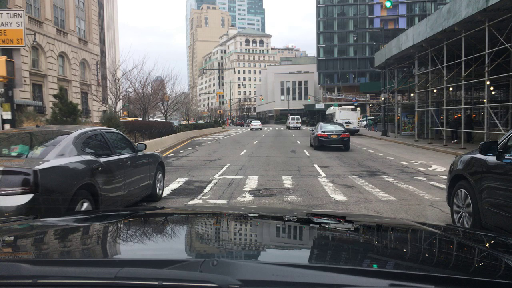

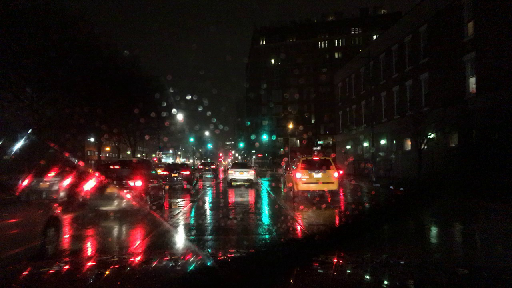

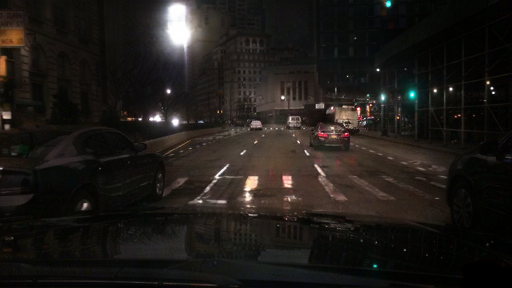

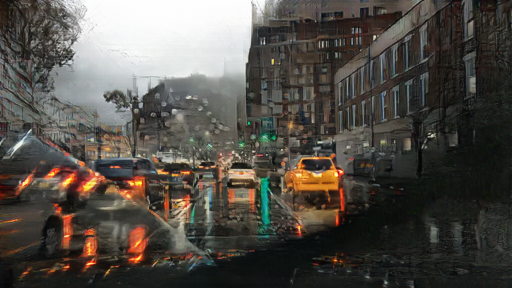

In [22]:
im='/home/sole/prj/GraduateWork/diploma/source/img/example_cyclegan.png'

im = to_image(im)
# show(im)
# a = split(im, to_rgb=False)
# b2 = split(a[1], direction='v', to_rgb=False)
show(*b) 
show(*b2) 
image_cyc_in = b[0]
image_cyc_out = b2[0]
image_cyc_in_b2a = b[1]
image_cyc_out_b2a = b2[1]


SSIM: 0.25675256472650787
MSE: 24544.162753634984
PSNR: 4.231321387599088


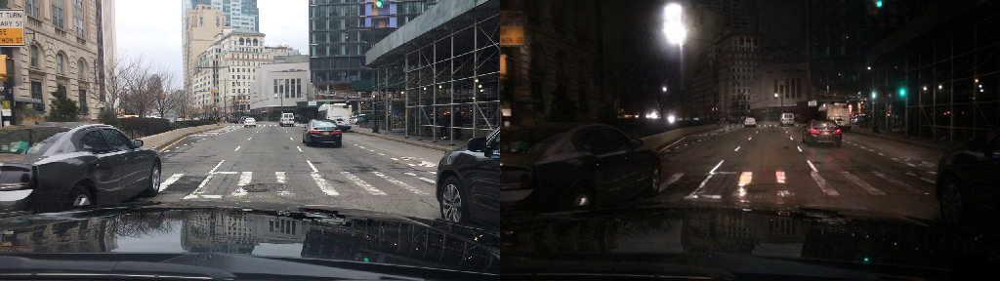

SSIM: 0.3573353127923784
MSE: 21669.041849772137
PSNR: 4.772406525271663


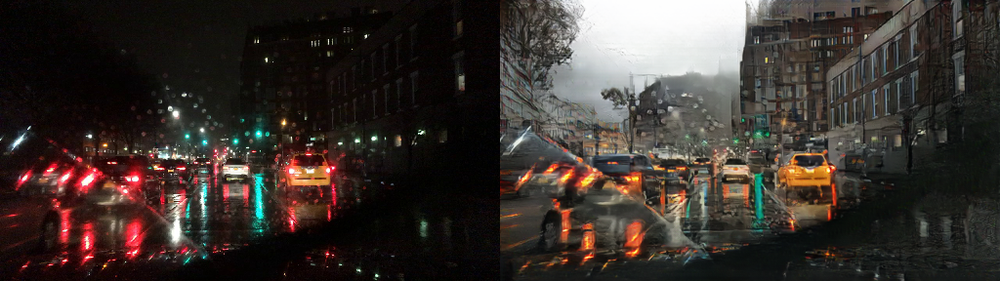

In [27]:
evaluate(image_cyc_in, image_cyc_out)
show(concat(image_cyc_in, image_cyc_out))
evaluate(image_cyc_in_b2a, image_cyc_out_b2a)
show(concat(image_cyc_in_b2a, image_cyc_out_b2a))

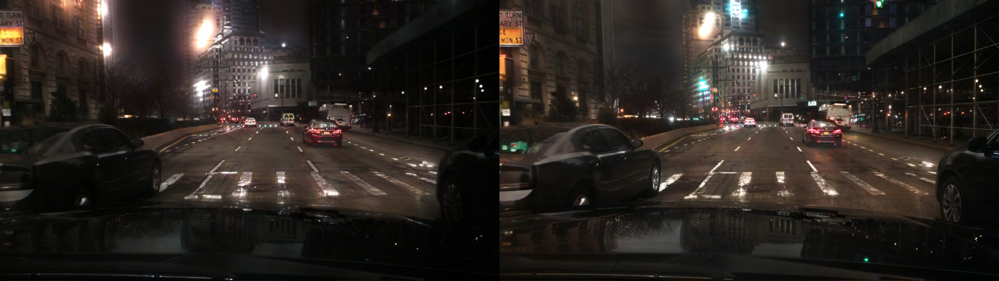

In [136]:
no_in = concat(image_no_in, image_in)
show(no_in)

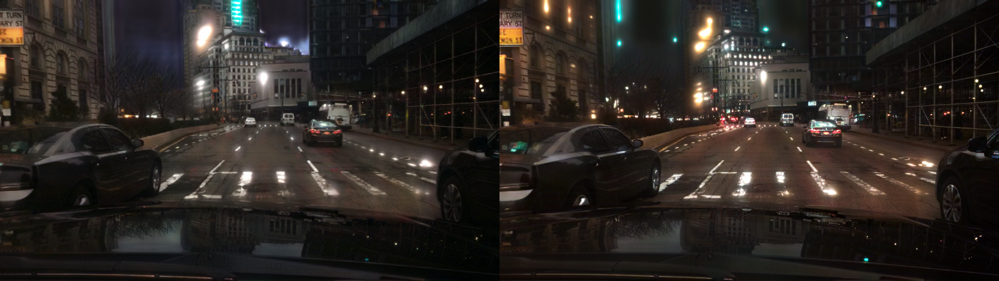

In [137]:
no_bn = concat(image_no_bn, image_bn)
show(no_bn)

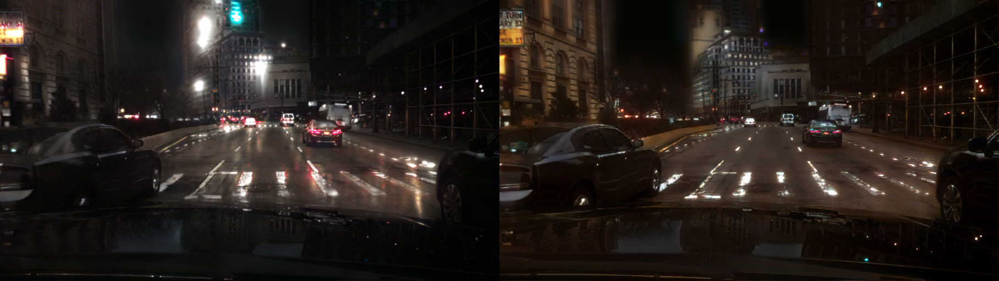

In [138]:
no_ln = concat(image_no_ln, image_ln)
show(no_ln)

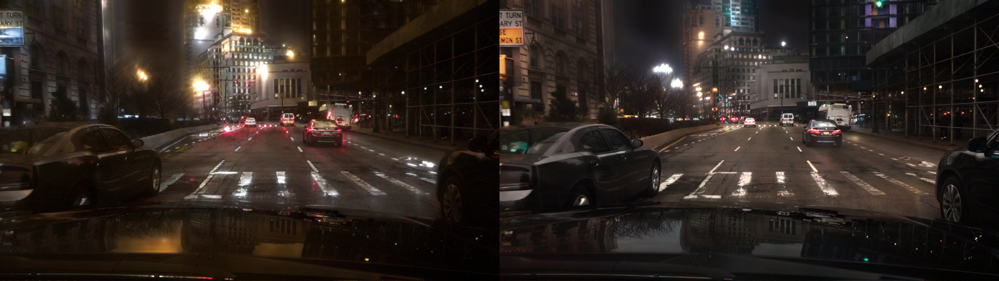

In [141]:
no_vgg = concat(image_unit, image_vgg)
show(no_vgg)

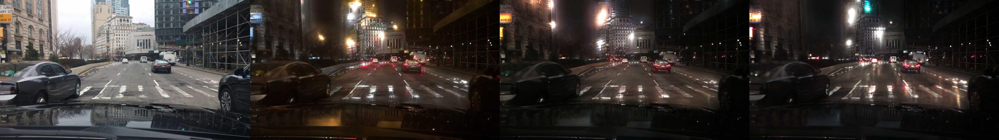

In [175]:
c = concat(image, image_unit)
c = concat(c, image_no_in)
c = concat(c, image_no_ln)
show(c)
save(c, './no_vgg_cmp.png')

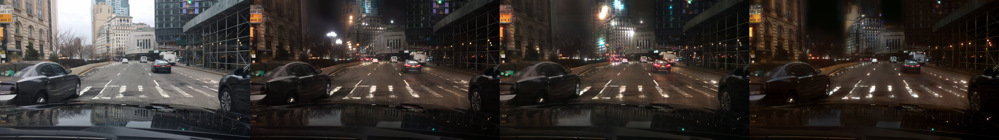

In [176]:
c = concat(image, image_vgg)
c = concat(c, image_in)
c = concat(c, image_ln)
show(c)
save(c, './vgg_cmp.png')

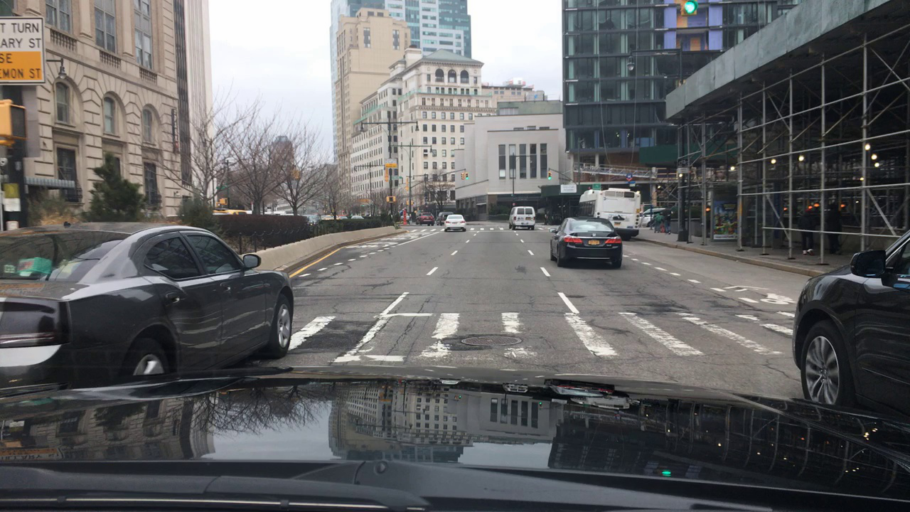

In [177]:
show(image)

In [182]:
evaluate(image, image_vgg)

Images size are diffeerent: (512, 910, 3) != (512, 908, 3)
Get cropped: 512 908
SSIM: 0.5319513469856353
Images size are diffeerent: (512, 910, 3) != (512, 908, 3)
Get cropped: 512 908
MSE: 17068.6119712796
Images size are diffeerent: (512, 910, 3) != (512, 908, 3)
Get cropped: 512 908
PSNR: 5.808821553784771


In [181]:
evaluate(image, image_unit)

Images size are diffeerent: (512, 910, 3) != (512, 908, 3)
Get cropped: 512 908
SSIM: 0.39905389462514274
Images size are diffeerent: (512, 910, 3) != (512, 908, 3)
Get cropped: 512 908
MSE: 18441.42445407145
Images size are diffeerent: (512, 910, 3) != (512, 908, 3)
Get cropped: 512 908
PSNR: 5.47285897043461


In [183]:
evaluate(image, image_bn)

Images size are diffeerent: (512, 910, 3) != (512, 908, 3)
Get cropped: 512 908
SSIM: 0.4866129442932607
Images size are diffeerent: (512, 910, 3) != (512, 908, 3)
Get cropped: 512 908
MSE: 17833.798770047495
Images size are diffeerent: (512, 910, 3) != (512, 908, 3)
Get cropped: 512 908
PSNR: 5.6183649895182795


In [184]:
evaluate(image, image_ln)

Images size are diffeerent: (512, 910, 3) != (512, 908, 3)
Get cropped: 512 908
SSIM: 0.34121238413714416
Images size are diffeerent: (512, 910, 3) != (512, 908, 3)
Get cropped: 512 908
MSE: 23591.074595178277
Images size are diffeerent: (512, 910, 3) != (512, 908, 3)
Get cropped: 512 908
PSNR: 4.403326370180526


In [185]:
evaluate(image, image_in)

Images size are diffeerent: (512, 910, 3) != (512, 908, 3)
Get cropped: 512 908
SSIM: 0.5150699570810249
Images size are diffeerent: (512, 910, 3) != (512, 908, 3)
Get cropped: 512 908
MSE: 16716.570043622658
Images size are diffeerent: (512, 910, 3) != (512, 908, 3)
Get cropped: 512 908
PSNR: 5.89933188478959


In [186]:
evaluate(image, image_no_in)

Images size are diffeerent: (512, 910, 3) != (512, 908, 3)
Get cropped: 512 908
SSIM: 0.3441473368160277
Images size are diffeerent: (512, 910, 3) != (512, 908, 3)
Get cropped: 512 908
MSE: 19469.164720711728
Images size are diffeerent: (512, 910, 3) != (512, 908, 3)
Get cropped: 512 908
PSNR: 5.237330413441425


In [187]:
evaluate(image, image_no_bn)

Images size are diffeerent: (512, 910, 3) != (512, 908, 3)
Get cropped: 512 908
SSIM: 0.4669181201144239
Images size are diffeerent: (512, 910, 3) != (512, 908, 3)
Get cropped: 512 908
MSE: 17294.85706265487
Images size are diffeerent: (512, 910, 3) != (512, 908, 3)
Get cropped: 512 908
PSNR: 5.7516338382986145


In [188]:
evaluate(image, image_no_ln)

Images size are diffeerent: (512, 910, 3) != (512, 908, 3)
Get cropped: 512 908
SSIM: 0.3297244796161351
Images size are diffeerent: (512, 910, 3) != (512, 908, 3)
Get cropped: 512 908
MSE: 21432.322052674146
Images size are diffeerent: (512, 910, 3) != (512, 908, 3)
Get cropped: 512 908
PSNR: 4.8201113429498745


In [193]:
evaluate(image, image_bdd_ln)

Images size are diffeerent: (512, 910, 3) != (512, 908, 3)
Get cropped: 512 908
SSIM: 0.4445429539228152
Images size are diffeerent: (512, 910, 3) != (512, 908, 3)
Get cropped: 512 908
MSE: 18906.453688566904
Images size are diffeerent: (512, 910, 3) != (512, 908, 3)
Get cropped: 512 908
PSNR: 5.364702856411133


In [194]:
evaluate(image, image_bdd_in)

Images size are diffeerent: (512, 910, 3) != (512, 908, 3)
Get cropped: 512 908
SSIM: 0.4904922175708945
Images size are diffeerent: (512, 910, 3) != (512, 908, 3)
Get cropped: 512 908
MSE: 17993.69186441699
Images size are diffeerent: (512, 910, 3) != (512, 908, 3)
Get cropped: 512 908
PSNR: 5.579600817998312


### Test Batch

In [76]:
%cd /mnt/w/prj/GraduateWork/day2night/UNIT/

checkdir="checkpoints/vgg"
checkpoint=f"{checkdir}/gen_01000000.pt"
config="configs/unit_day2night_vgg.yaml"
indir="/mnt/w/prj/data/nexet/nexet_2017_1/testB"
outdir=f"{checkdir}/out_b2a"
gpu=0
day2night=0
number=200

!bash scripts/test.sh $checkdir $checkpoint $config $indir $outdir $number $gpu $day2night

/mnt/w/prj/GraduateWork/day2night/UNIT
------------------------------------------------------
UNIT | day2night | starting...
------------------------------------------------------
------------------------------------------------------
 Show all GPUs
------------------------------------------------------
index, name, driver_version, memory.total [MiB], memory.used [MiB], memory.free [MiB]
0, GeForce RTX 2080, 418.56, 7944 MiB, 778 MiB, 7166 MiB
------------------------------------------------------
------------------------------------------------------
 Starting tests... 
------------------------------------------------------
 Trainer: UNIT
 Use config: configs/unit_day2night_vgg.yaml
 Input folder: /mnt/w/prj/data/nexet/nexet_2017_1/testB
 Output folder: checkpoints/vgg/out_b2a
 Checkpoint: checkpoints/vgg/gen_01000000.pt
 Domains: Night -> Day
 GPU: 0
 Number: 200
------------------------------------------------------
Launch testing script...
CUDA Devices
index, name, driver_version, 

/mnt/w/prj/data/nexet/nexet_2017_1/testB/frame_079de6c8987f18c01110ebe5028ba8e1_c801469f90f3978c61821be2f5998679_30000-1280_720.jpg --> checkpoints/vgg/out_b2a                     
/mnt/w/prj/data/nexet/nexet_2017_1/testB/frame_07a75aa2-053a-4094-bb7c-9f9dedc33bdb_00000-1280_720.jpg --> checkpoints/vgg/out_b2a                     
/mnt/w/prj/data/nexet/nexet_2017_1/testB/frame_07c5f07badbd3e2b16a3018a0c414318_36a7a479aada2c5e8dc05d7f193b8476_90000-1280_720.jpg --> checkpoints/vgg/out_b2a                     
/mnt/w/prj/data/nexet/nexet_2017_1/testB/frame_07da354161381b95e0cd151a33e16fc1_3070938dff12818f3106ca8adf38f8ec_0-1280_720.jpg --> checkpoints/vgg/out_b2a                     
/mnt/w/prj/data/nexet/nexet_2017_1/testB/frame_07da354161381b95e0cd151a33e16fc1_6377203bad16244edfd335447171b0cf_0-1280_720.jpg --> checkpoints/vgg/out_b2a                     
/mnt/w/prj/data/nexet/nexet_2017_1/testB/frame_07da354161381b95e0cd151a33e16fc1_94db32c9d41701b0238ea08ff18b8538_0-1280_720.jpg --> 

/mnt/w/prj/data/nexet/nexet_2017_1/testB/frame_12e91c5164db56ca2d1a85fbc87fe6b7_6ad459c1ea3ded65a48f5c6fa4114463_30000-1280_720.jpg --> checkpoints/vgg/out_b2a                     
/mnt/w/prj/data/nexet/nexet_2017_1/testB/frame_12e91c5164db56ca2d1a85fbc87fe6b7_d97ce1e7029fded0f8cd1b5736ea991e_90000-1280_720.jpg --> checkpoints/vgg/out_b2a                     
/mnt/w/prj/data/nexet/nexet_2017_1/testB/frame_1319b4d01df5db69fe341eebf3ec7214_757da7d91b1a7a9f6273d6158419e6a7_30000-1280_720.jpg --> checkpoints/vgg/out_b2a                     
/mnt/w/prj/data/nexet/nexet_2017_1/testB/frame_1332619de75ad70a2eab5e944f4408eb_375edd51e78425d4becc194c2aff903c_0-1280_720.jpg --> checkpoints/vgg/out_b2a                     
/mnt/w/prj/data/nexet/nexet_2017_1/testB/frame_1332619de75ad70a2eab5e944f4408eb_884b45e1c6d0b7b3096f68663c310939_0-1280_720.jpg --> checkpoints/vgg/out_b2a                     
/mnt/w/prj/data/nexet/nexet_2017_1/testB/frame_1332619de75ad70a2eab5e944f4408eb_ac31ce2971f7c01b7b4e593

In [140]:
%cd /mnt/w/prj/GraduateWork/day2night/UNIT/

checkdir="checkpoints/vgg"
checkpoint=f"{checkdir}/gen_01000000.pt"
config="configs/unit_day2night_vgg.yaml"
indir="/mnt/w/prj/data/nexet/nexet_2017_1/testA"
outdir=f"{checkdir}/out"
gpu=0
day2night=1
number=200

!bash scripts/test.sh $checkdir $checkpoint $config $indir $outdir $number $gpu $day2night

/mnt/w/prj/GraduateWork/day2night/UNIT
------------------------------------------------------
UNIT | day2night | starting...
------------------------------------------------------
------------------------------------------------------
 Show all GPUs
------------------------------------------------------
index, name, driver_version, memory.total [MiB], memory.used [MiB], memory.free [MiB]
0, GeForce RTX 2080, 418.56, 7944 MiB, 683 MiB, 7261 MiB
------------------------------------------------------
------------------------------------------------------
 Starting tests... 
------------------------------------------------------
 Trainer: UNIT
 Use config: configs/unit_day2night_vgg.yaml
 Input folder: /mnt/w/prj/data/nexet/nexet_2017_1/testA
 Output folder: checkpoints/vgg/out256
 Checkpoint: checkpoints/vgg/gen_01000000.pt
 Domains: Day -> Night
 GPU: 0
 Number: 200
------------------------------------------------------
Launch testing script...
CUDA Devices
index, name, driver_version, m

/mnt/w/prj/data/nexet/nexet_2017_1/testA/3c4bf095-1c78-421b-8f9e-4c9a285e78e5.mov-0001.jpg --> checkpoints/vgg/out256                     
/mnt/w/prj/data/nexet/nexet_2017_1/testA/3d5de078-e5a0-4f9a-b896-777fbf60d2bd.mov-0001.jpg --> checkpoints/vgg/out256                     
/mnt/w/prj/data/nexet/nexet_2017_1/testA/3e7c32a1-2957-4a07-a8bd-a3b3d14ef8c0.mov-0001.jpg --> checkpoints/vgg/out256                     
/mnt/w/prj/data/nexet/nexet_2017_1/testA/3e81ef36-8141-46ca-ab96-32d5afc83aa3.mov-0001.jpg --> checkpoints/vgg/out256                     
/mnt/w/prj/data/nexet/nexet_2017_1/testA/3f4db8fc-4462-467b-8626-99ab9facb3ae.mov-0001.jpg --> checkpoints/vgg/out256                     
/mnt/w/prj/data/nexet/nexet_2017_1/testA/4029e474-3a9f-478c-bbef-b54bc9237f19.mov-0001.jpg --> checkpoints/vgg/out256                     
/mnt/w/prj/data/nexet/nexet_2017_1/testA/428716a1-cb42-4b38-a56a-c277eea9f768.mov-0001.jpg --> checkpoints/vgg/out256                     
/mnt/w/prj/data/nexet/nexet

In [77]:
%cd /mnt/w/prj/GraduateWork/day2night/UNIT/

checkdir="checkpoints/vgg"
checkpoint=f"{checkdir}/gen_00800000.pt"
config="configs/unit_day2night_vgg.yaml"
indir="/mnt/w/prj/data/nexet/nexet_2017_1/testB"
outdir=f"{checkdir}/out800_b2a"
gpu=0
day2night=0
number=200

!bash scripts/test.sh $checkdir $checkpoint $config $indir $outdir $number $gpu $day2night

/mnt/w/prj/GraduateWork/day2night/UNIT
------------------------------------------------------
UNIT | day2night | starting...
------------------------------------------------------
------------------------------------------------------
 Show all GPUs
------------------------------------------------------
index, name, driver_version, memory.total [MiB], memory.used [MiB], memory.free [MiB]
0, GeForce RTX 2080, 418.56, 7944 MiB, 778 MiB, 7166 MiB
------------------------------------------------------
------------------------------------------------------
 Starting tests... 
------------------------------------------------------
 Trainer: UNIT
 Use config: configs/unit_day2night_vgg.yaml
 Input folder: /mnt/w/prj/data/nexet/nexet_2017_1/testB
 Output folder: checkpoints/vgg/out800_b2a
 Checkpoint: checkpoints/vgg/gen_00800000.pt
 Domains: Night -> Day
 GPU: 0
 Number: 200
------------------------------------------------------
Launch testing script...
CUDA Devices
index, name, driver_versio

/mnt/w/prj/data/nexet/nexet_2017_1/testB/frame_0774a5f5-0f1a-4d80-8f46-b28bf9659905_00002-1280_720.jpg --> checkpoints/vgg/out800_b2a                     
/mnt/w/prj/data/nexet/nexet_2017_1/testB/frame_079de6c8987f18c01110ebe5028ba8e1_acf5b84883978436894f918058df8b18_90000-1280_720.jpg --> checkpoints/vgg/out800_b2a                     
/mnt/w/prj/data/nexet/nexet_2017_1/testB/frame_079de6c8987f18c01110ebe5028ba8e1_c801469f90f3978c61821be2f5998679_30000-1280_720.jpg --> checkpoints/vgg/out800_b2a                     
/mnt/w/prj/data/nexet/nexet_2017_1/testB/frame_07a75aa2-053a-4094-bb7c-9f9dedc33bdb_00000-1280_720.jpg --> checkpoints/vgg/out800_b2a                     
/mnt/w/prj/data/nexet/nexet_2017_1/testB/frame_07c5f07badbd3e2b16a3018a0c414318_36a7a479aada2c5e8dc05d7f193b8476_90000-1280_720.jpg --> checkpoints/vgg/out800_b2a                     
/mnt/w/prj/data/nexet/nexet_2017_1/testB/frame_07da354161381b95e0cd151a33e16fc1_3070938dff12818f3106ca8adf38f8ec_0-1280_720.jpg --> checkp

/mnt/w/prj/data/nexet/nexet_2017_1/testB/frame_12646b64a49ac81f9e237aea53f63c08_adfd24698ee2859738d97e2025b9f462_0-1280_720.jpg --> checkpoints/vgg/out800_b2a                     
/mnt/w/prj/data/nexet/nexet_2017_1/testB/frame_12646b64a49ac81f9e237aea53f63c08_e273ee06eabf6884bb7318e3bbf06fbd_30000-1280_720.jpg --> checkpoints/vgg/out800_b2a                     
/mnt/w/prj/data/nexet/nexet_2017_1/testB/frame_12be5c5d-225b-492f-98b3-c88b192496dd_00001-1280_720.jpg --> checkpoints/vgg/out800_b2a                     
/mnt/w/prj/data/nexet/nexet_2017_1/testB/frame_12e91c5164db56ca2d1a85fbc87fe6b7_27e647d842f72a301cbaf0eddcce6269_60000-1280_720.jpg --> checkpoints/vgg/out800_b2a                     
/mnt/w/prj/data/nexet/nexet_2017_1/testB/frame_12e91c5164db56ca2d1a85fbc87fe6b7_6ad459c1ea3ded65a48f5c6fa4114463_30000-1280_720.jpg --> checkpoints/vgg/out800_b2a                     
/mnt/w/prj/data/nexet/nexet_2017_1/testB/frame_12e91c5164db56ca2d1a85fbc87fe6b7_d97ce1e7029fded0f8cd1b5736ea991e_

In [ ]:
%cd /mnt/w/prj/GraduateWork/day2night/UNIT/

checkdir="checkpoints/vgg_in"
checkpoint=f"{checkdir}/gen_00633000.pt"
config="configs/unit_day2night_vgg_in.yaml"
indir="/mnt/w/prj/data/nexet/nexet_2017_1/testA"
outdir=f"{checkdir}/out633"
gpu=0
day2night=1
number=200

!bash scripts/test.sh $checkdir $checkpoint $config $indir $outdir $number $gpu $day2night

In [ ]:
%cd /mnt/w/prj/GraduateWork/day2night/UNIT/

checkdir="checkpoints/vgg_ln"
checkpoint=f"{checkdir}/gen_01000000.pt"
config="configs/unit_day2night_vgg_128_ln.yaml"
indir="/mnt/w/prj/data/nexet/nexet_2017_1/testA"
outdir=f"{checkdir}/out"
gpu=0
day2night=1
number=200

!bash scripts/test.sh $checkdir $checkpoint $config $indir $outdir $number $gpu $day2night

In [ ]:
%cd /mnt/w/prj/GraduateWork/day2night/UNIT/

checkdir="checkpoints/bdd_nexet"
checkpoint=f"{checkdir}/gen_00762000.pt"
config="configs/unit_day2night_bdd_nexet_vgg.yaml"
indir="/mnt/w/prj/data/nexet/nexet_2017_1/testA"
outdir=f"{checkdir}/out"
gpu=0
day2night=1
number=200

!bash scripts/test.sh $checkdir $checkpoint $config $indir $outdir $number $gpu $day2night

In [ ]:
%cd /mnt/w/prj/GraduateWork/day2night/UNIT/

checkdir="checkpoints/bdd_nexet_vgg_in"
checkpoint=f"{checkdir}/gen_00651000.pt"
config="configs/unit_day2night_bdd_nexet_vgg_in.yaml"
indir="/mnt/w/prj/data/nexet/nexet_2017_1/testA"
outdir=f"{checkdir}/out"
gpu=0
day2night=1
number=200

!bash scripts/test.sh $checkdir $checkpoint $config $indir $outdir $number $gpu $day2night

In [ ]:
%cd /mnt/w/prj/GraduateWork/day2night/UNIT/

checkdir="checkpoints/bdd_nexet_vgg_in"
checkpoint=f"{checkdir}/gen_00500000.pt"
config="configs/unit_day2night_bdd_nexet_vgg_in.yaml"
indir="/mnt/w/prj/data/nexet/nexet_2017_1/testA"
outdir=f"{checkdir}/out500"
gpu=0
day2night=1
number=200

!bash scripts/test.sh $checkdir $checkpoint $config $indir $outdir $number $gpu $day2night

In [117]:
%cd /mnt/w/prj/GraduateWork/day2night/UNIT/

checkdir="checkpoints/bdd_nexet_vgg"
checkpoint=f"{checkdir}/gen_01000000.pt"
config="configs/unit_day2night_bdd_nexet_vgg.yaml"
indir="/mnt/w/prj/data/nexet/nexet_2017_1/testB"
outdir=f"{checkdir}/out_b2a"
gpu=0
day2night=0
number=200

!bash scripts/test.sh $checkdir $checkpoint $config $indir $outdir $number $gpu $day2night

/mnt/w/prj/GraduateWork/day2night/UNIT
------------------------------------------------------
UNIT | day2night | starting...
------------------------------------------------------
------------------------------------------------------
 Show all GPUs
------------------------------------------------------
index, name, driver_version, memory.total [MiB], memory.used [MiB], memory.free [MiB]
0, GeForce RTX 2080, 418.56, 7944 MiB, 777 MiB, 7167 MiB
------------------------------------------------------
------------------------------------------------------
 Starting tests... 
------------------------------------------------------
 Trainer: UNIT
 Use config: configs/unit_day2night_bdd_nexet_vgg.yaml
 Input folder: /mnt/w/prj/data/nexet/nexet_2017_1/testB
 Output folder: checkpoints/bdd_nexet_vgg/out_b2a
 Checkpoint: checkpoints/bdd_nexet_vgg/gen_01000000.pt
 Domains: Night -> Day
 GPU: 0
 Number: 200
------------------------------------------------------
Launch testing script...
CUDA Devices

/mnt/w/prj/data/nexet/nexet_2017_1/testB/frame_0752a4543574d68ebd652e5d21c328b8_8c6998b6ce5ba8732646e81b6006f335_0-1280_720.jpg --> checkpoints/bdd_nexet_vgg/out_b2a                     
/mnt/w/prj/data/nexet/nexet_2017_1/testB/frame_0754e8027e3da6e69c7c6939663eaaf7_03a2987cf29290ebf56059cd38f87fb4_60000-1280_720.jpg --> checkpoints/bdd_nexet_vgg/out_b2a                     
/mnt/w/prj/data/nexet/nexet_2017_1/testB/frame_07690ae8-60a8-4caf-a0c0-d95a4c06068a_00000-1280_720.jpg --> checkpoints/bdd_nexet_vgg/out_b2a                     
/mnt/w/prj/data/nexet/nexet_2017_1/testB/frame_0774a5f5-0f1a-4d80-8f46-b28bf9659905_00002-1280_720.jpg --> checkpoints/bdd_nexet_vgg/out_b2a                     
/mnt/w/prj/data/nexet/nexet_2017_1/testB/frame_079de6c8987f18c01110ebe5028ba8e1_acf5b84883978436894f918058df8b18_90000-1280_720.jpg --> checkpoints/bdd_nexet_vgg/out_b2a                     
/mnt/w/prj/data/nexet/nexet_2017_1/testB/frame_079de6c8987f18c01110ebe5028ba8e1_c801469f90f3978c61821be2f59

/mnt/w/prj/data/nexet/nexet_2017_1/testB/frame_12637926fbcbb8a83f43f646f4ea3898_18bdfe6bb68858d9c343db7fd94737cc_90000-1280_720.jpg --> checkpoints/bdd_nexet_vgg/out_b2a                     
/mnt/w/prj/data/nexet/nexet_2017_1/testB/frame_12637926fbcbb8a83f43f646f4ea3898_49484987f31b163f201b4ede5ba86d24_30000-1280_720.jpg --> checkpoints/bdd_nexet_vgg/out_b2a                     
/mnt/w/prj/data/nexet/nexet_2017_1/testB/frame_12637926fbcbb8a83f43f646f4ea3898_d8577c0e168bc874a4b31fc33c2808bb_0-1280_720.jpg --> checkpoints/bdd_nexet_vgg/out_b2a                     
/mnt/w/prj/data/nexet/nexet_2017_1/testB/frame_12646b64a49ac81f9e237aea53f63c08_08acb65a26a5887a8e9468f32f603dcf_0-1280_720.jpg --> checkpoints/bdd_nexet_vgg/out_b2a                     
/mnt/w/prj/data/nexet/nexet_2017_1/testB/frame_12646b64a49ac81f9e237aea53f63c08_4d511133eabaec65aa06f111ec40d91a_60000-1280_720.jpg --> checkpoints/bdd_nexet_vgg/out_b2a                     
/mnt/w/prj/data/nexet/nexet_2017_1/testB/frame_12646b

In [ ]:
%cd /mnt/w/prj/GraduateWork/day2night/UNIT/

checkdir="checkpoints/bdd_nexet_vgg_ln"
checkpoint=f"{checkdir}/gen_00510000.pt"
config="configs/unit_day2night_bdd_nexet_vgg_ln.yaml"
indir="/mnt/w/prj/data/nexet/nexet_2017_1/testA"
outdir=f"{checkdir}/out"
gpu=0
day2night=1
number=200

!bash scripts/test.sh $checkdir $checkpoint $config $indir $outdir $number $gpu $day2night

In [ ]:
%cd /mnt/w/prj/GraduateWork/day2night/UNIT/

checkdir="checkpoints/512"
checkpoint=f"{checkdir}/gen_00758000.pt"
config="configs/unit_day2night_512.yaml"
indir="/mnt/w/prj/data/nexet/nexet_2017_1/testA"
outdir=f"{checkdir}/out"
gpu=0
day2night=1
number=200

!bash scripts/test.sh $checkdir $checkpoint $config $indir $outdir $number $gpu $day2night

In [ ]:
%cd /mnt/w/prj/GraduateWork/day2night/UNIT/

checkdir="checkpoints/512_vgg"
checkpoint=f"{checkdir}/gen_00473000.pt"
config="configs/unit_day2night_512_vgg.yaml"
indir="/mnt/w/prj/data/nexet/nexet_2017_1/testA"
outdir=f"{checkdir}/out473"
gpu=0
day2night=1
number=200

!bash scripts/test.sh $checkdir $checkpoint $config $indir $outdir $number $gpu $day2night

In [40]:
%cd /mnt/w/prj/GraduateWork/day2night/UNIT/

checkdir="checkpoints/512_vgg"
checkpoint=f"{checkdir}/gen_00653000.pt"
config="configs/unit_day2night_512_vgg.yaml"
indir="/mnt/w/prj/data/nexet/nexet_2017_1/testA"
outdir=f"{checkdir}/out653"
gpu=0
day2night=1
number=200

!bash scripts/test.sh $checkdir $checkpoint $config $indir $outdir $number $gpu $day2night

/mnt/w/prj/GraduateWork/day2night/UNIT
------------------------------------------------------
UNIT | day2night | starting...
------------------------------------------------------
------------------------------------------------------
 Show all GPUs
------------------------------------------------------
index, name, driver_version, memory.total [MiB], memory.used [MiB], memory.free [MiB]
0, GeForce RTX 2080, 418.56, 7944 MiB, 958 MiB, 6986 MiB
------------------------------------------------------
------------------------------------------------------
 Starting tests... 
------------------------------------------------------
 Trainer: UNIT
 Use config: configs/unit_day2night_512_vgg.yaml
 Input folder: /mnt/w/prj/data/nexet/nexet_2017_1/testA
 Output folder: checkpoints/512_vgg/out653
 Checkpoint: checkpoints/512_vgg/gen_00653000.pt
 Domains: Day -> Night
 GPU: 0
 Number: 200
------------------------------------------------------
Launch testing script...
CUDA Devices
index, name, drive

/mnt/w/prj/data/nexet/nexet_2017_1/testA/3c1210b8-6e9e-4fc5-a85a-94d6a87f672b.mov-0001.jpg --> checkpoints/512_vgg/out653                     
/mnt/w/prj/data/nexet/nexet_2017_1/testA/3c1e38cb-08c7-4fa6-8e8c-25a21cf1cafa.mov-0001.jpg --> checkpoints/512_vgg/out653                     
/mnt/w/prj/data/nexet/nexet_2017_1/testA/3c4bf095-1c78-421b-8f9e-4c9a285e78e5.mov-0001.jpg --> checkpoints/512_vgg/out653                     
/mnt/w/prj/data/nexet/nexet_2017_1/testA/3d5de078-e5a0-4f9a-b896-777fbf60d2bd.mov-0001.jpg --> checkpoints/512_vgg/out653                     
/mnt/w/prj/data/nexet/nexet_2017_1/testA/3e7c32a1-2957-4a07-a8bd-a3b3d14ef8c0.mov-0001.jpg --> checkpoints/512_vgg/out653                     
/mnt/w/prj/data/nexet/nexet_2017_1/testA/3e81ef36-8141-46ca-ab96-32d5afc83aa3.mov-0001.jpg --> checkpoints/512_vgg/out653                     
/mnt/w/prj/data/nexet/nexet_2017_1/testA/3f4db8fc-4462-467b-8626-99ab9facb3ae.mov-0001.jpg --> checkpoints/512_vgg/out653                     

In [28]:
%cd /mnt/w/prj/GraduateWork/day2night/UNIT/

checkdir="checkpoints/unit_no_err"
checkpoint=f"{checkdir}/gen_00252000.pt"
config="configs/unit_day2night.yaml"
indir="/mnt/w/prj/data/nexet/nexet_2017_1/testB"
outdir=f"{checkdir}/out_b2a"
gpu=0
day2night=0
number=100

!bash scripts/test.sh $checkdir $checkpoint $config $indir $outdir $number $gpu $day2night

/mnt/w/prj/GraduateWork/day2night/UNIT
------------------------------------------------------
UNIT | day2night | starting...
------------------------------------------------------
------------------------------------------------------
 Show all GPUs
------------------------------------------------------
index, name, driver_version, memory.total [MiB], memory.used [MiB], memory.free [MiB]
0, GeForce RTX 2080, 418.56, 7944 MiB, 514 MiB, 7430 MiB
------------------------------------------------------
------------------------------------------------------
 Starting tests... 
------------------------------------------------------
 Trainer: UNIT
 Use config: configs/unit_day2night.yaml
 Input folder: /mnt/w/prj/data/nexet/nexet_2017_1/testB
 Output folder: checkpoints/unit_no_err/out_b2a
 Checkpoint: checkpoints/unit_no_err/gen_00252000.pt
 Domains: Night -> Day
 GPU: 0
 Number: 100
------------------------------------------------------
Launch testing script...
CUDA Devices
index, name, driv

/mnt/w/prj/data/nexet/nexet_2017_1/testB/c4fd0200-0f4f-4849-bff2-7aab755464d0.mov-0001.jpg --> checkpoints/unit_no_err/out_b2a                     
/mnt/w/prj/data/nexet/nexet_2017_1/testB/c5222d6b-c82d-41dc-99b0-b26c032bf070.mov-0001.jpg --> checkpoints/unit_no_err/out_b2a                     
/mnt/w/prj/data/nexet/nexet_2017_1/testB/c6cf87dc-1a17-414b-9e4c-f4a48ad0941e.mov-0001.jpg --> checkpoints/unit_no_err/out_b2a                     
/mnt/w/prj/data/nexet/nexet_2017_1/testB/c8f6a19a-b3f5-4c51-ae08-c47d6e498177.mov-0001.jpg --> checkpoints/unit_no_err/out_b2a                     
/mnt/w/prj/data/nexet/nexet_2017_1/testB/cccc4a8b-6a58-4395-9330-cea140774194.mov-0001.jpg --> checkpoints/unit_no_err/out_b2a                     
/mnt/w/prj/data/nexet/nexet_2017_1/testB/d069d36d-27d9-4d14-bf0b-7664f8c3d5b6.mov-0001.jpg --> checkpoints/unit_no_err/out_b2a                     
/mnt/w/prj/data/nexet/nexet_2017_1/testB/def265c3-ae3a-403b-93d1-c692325fec49.mov-0001.jpg --> checkpoints/unit_

/mnt/w/prj/data/nexet/nexet_2017_1/testB/frame_0752a4543574d68ebd652e5d21c328b8_4fd140d650f5d3abfbb5d4947464c23c_60000-1280_720.jpg --> checkpoints/unit_no_err/out_b2a                     
/mnt/w/prj/data/nexet/nexet_2017_1/testB/frame_0752a4543574d68ebd652e5d21c328b8_8c6998b6ce5ba8732646e81b6006f335_0-1280_720.jpg --> checkpoints/unit_no_err/out_b2a                     
/mnt/w/prj/data/nexet/nexet_2017_1/testB/frame_0754e8027e3da6e69c7c6939663eaaf7_03a2987cf29290ebf56059cd38f87fb4_60000-1280_720.jpg --> checkpoints/unit_no_err/out_b2a                     
/mnt/w/prj/data/nexet/nexet_2017_1/testB/frame_07690ae8-60a8-4caf-a0c0-d95a4c06068a_00000-1280_720.jpg --> checkpoints/unit_no_err/out_b2a                     
/mnt/w/prj/data/nexet/nexet_2017_1/testB/frame_0774a5f5-0f1a-4d80-8f46-b28bf9659905_00002-1280_720.jpg --> checkpoints/unit_no_err/out_b2a                     
/mnt/w/prj/data/nexet/nexet_2017_1/testB/frame_079de6c8987f18c01110ebe5028ba8e1_acf5b84883978436894f918058df8b18_9000